# iWildCam 2019 exploration

The Camera Traps (or Wild Cams) dataset - [iWildCam 2019](https://github.com/visipedia/iwildcam_comp) enables the automatic collection of large quantities of image data. Biologists all over the world use camera traps to monitor biodiversity and population density of animal species. 

We have recently been making strides towards automating the species classification challenge in camera traps, but as we try to expand the scope of these models from specific regions where we have collected training data to nearby areas we are faced with an interesting probem: __how do you classify a species in a new region that you may not have seen in previous training data?__

I believe IRM could help in this case.

In [1]:
import pandas as pd
import numpy as np
import os
import os.path
from PIL import Image

%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
os.listdir('../../../data/iWildCam/')

['test.csv',
 'train.csv',
 'train_images.zip',
 'iwildcam-2019-fgvc6.zip',
 'train',
 'sample_submission.csv',
 'test_images.zip',
 'test']

In [3]:
train_df = pd.read_csv('../../../data/iWildCam/train.csv')
train_df.count()

category_id       196299
date_captured     196299
file_name         196299
frame_num         196299
id                196299
location          196299
rights_holder     196299
seq_id            196299
seq_num_frames    196299
width             196299
height            196299
dtype: int64

In [4]:
train_df.head()

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747
2,0,2014-05-11 11:56:46,59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg,1,59279ce3-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6faa92d1-5567-11e8-b1ae-dca9047ef277,1,1024,747
3,0,2013-10-06 02:00:00,5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a2af4ab-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f7d4702-5567-11e8-9e03-dca9047ef277,1,1024,747
4,0,2011-07-12 13:11:16,599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg,3,599fbd89-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f1728a1-5567-11e8-9be7-dca9047ef277,3,1024,747


We will not use the test set since the images do not have category_id. 

In [5]:
test_df = pd.read_csv('../../../data/iWildCam/test.csv')
test_df.count()
test_df.head()

,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,03-Jan-2016 11:30:56,bce932f6-2bf6-11e9-bcad-06f10d5896c4.jpg,1,bce932f6-2bf6-11e9-bcad-06f10d5896c4,37,Idaho Department of Fish and Game,6e9ac61c-2e32-11e9-90ef-dca9047ef277,5,1024,726
1,03-Jan-2016 11:30:57,bce932f7-2bf6-11e9-bcad-06f10d5896c4.jpg,2,bce932f7-2bf6-11e9-bcad-06f10d5896c4,37,Idaho Department of Fish and Game,6e9ac61c-2e32-11e9-90ef-dca9047ef277,5,1024,726
2,03-Jan-2016 11:30:58,bce932f8-2bf6-11e9-bcad-06f10d5896c4.jpg,3,bce932f8-2bf6-11e9-bcad-06f10d5896c4,37,Idaho Department of Fish and Game,6e9ac61c-2e32-11e9-90ef-dca9047ef277,5,1024,726
3,03-Jan-2016 11:30:59,bce932f9-2bf6-11e9-bcad-06f10d5896c4.jpg,4,bce932f9-2bf6-11e9-bcad-06f10d5896c4,37,Idaho Department of Fish and Game,6e9ac61c-2e32-11e9-90ef-dca9047ef277,5,1024,726
4,03-Jan-2016 11:31:00,bce932fa-2bf6-11e9-bcad-06f10d5896c4.jpg,5,bce932fa-2bf6-11e9-bcad-06f10d5896c4,37,Idaho Department of Fish and Game,6e9ac61c-2e32-11e9-90ef-dca9047ef277,5,1024,726


In [6]:
classes = """empty, 0
deer, 1
moose, 2
squirrel, 3
rodent, 4
small_mammal, 5
elk, 6
pronghorn_antelope, 7
rabbit, 8
bighorn_sheep, 9
fox, 10
coyote, 11
black_bear, 12
raccoon, 13
skunk, 14
wolf, 15
bobcat, 16
cat, 17
dog, 18
opossum, 19
bison, 20
mountain_goat, 21
mountain_lion, 22""".split('\n')
classes = {int(i.split(', ')[1]): i.split(', ')[0] for i in classes}
classes

{0: 'empty',
 1: 'deer',
 2: 'moose',
 3: 'squirrel',
 4: 'rodent',
 5: 'small_mammal',
 6: 'elk',
 7: 'pronghorn_antelope',
 8: 'rabbit',
 9: 'bighorn_sheep',
 10: 'fox',
 11: 'coyote',
 12: 'black_bear',
 13: 'raccoon',
 14: 'skunk',
 15: 'wolf',
 16: 'bobcat',
 17: 'cat',
 18: 'dog',
 19: 'opossum',
 20: 'bison',
 21: 'mountain_goat',
 22: 'mountain_lion'}

In [7]:
train_df['classes'] = train_df['category_id'].apply(lambda x: classes[x])
train_df['classes'].value_counts()

empty            131457
opossum           14106
raccoon            8623
coyote             7209
rabbit             6938
deer               6102
bobcat             5975
cat                4759
squirrel           3398
dog                3035
rodent             2210
skunk              1361
fox                1093
mountain_lion        33
Name: classes, dtype: int64

Plotting a few images across all categories

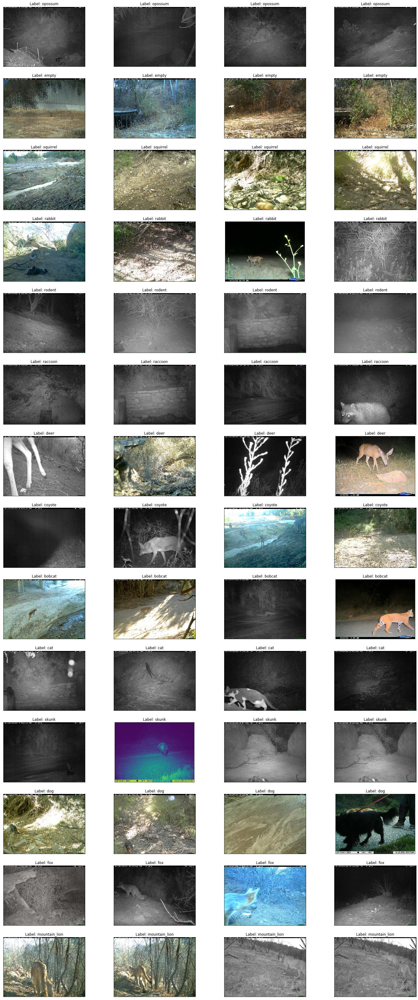

In [8]:
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(train_df.loc[train_df['classes'] == i, 'file_name'], 4) for i in train_df.classes.unique()]
imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in train_df.classes.unique()]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):
    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../../../data/iWildCam/train/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

Checking if locations vary based on the image class. A few times they are common between the two classes.

In [9]:
train_df['location'].loc[train_df['classes'] == 'raccoon'].value_counts()

100    2552
46     1464
33     1149
40      429
130     414
43      390
78      354
115     222
58      217
38      198
18      190
125     129
28      126
108     126
57      113
24       90
7        90
88       87
64       81
90       57
70       41
105      36
32       15
60       13
51       12
23        6
0         4
3         3
20        3
5         3
53        3
120       2
66        1
1         1
59        1
71        1
Name: location, dtype: int64

In [10]:
train_df['location'].loc[train_df['classes'] == 'coyote'].value_counts()

120    923
46     873
43     834
7      624
115    429
      ... 
47       2
26       2
30       2
45       1
16       1
Name: location, Length: 61, dtype: int64

Plotting a few images for raccoons and coyotes

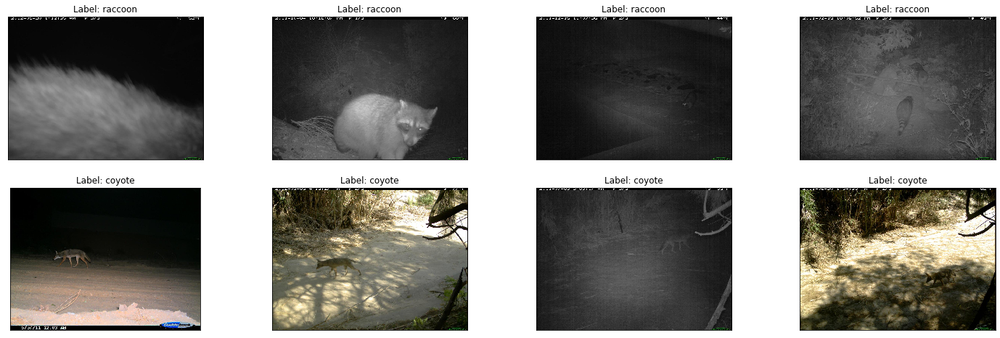

In [11]:
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(train_df.loc[train_df['classes'] == i, 'file_name'], 4) for i in ['raccoon', 'coyote']]

imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in ['raccoon', 'coyote']]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):

    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../../../data/iWildCam/train/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

Checking images from specific locations to understand if they differ by locations. This way the locations can function as environments.  

Look how sometimes a coyote can be also spotted during night time.

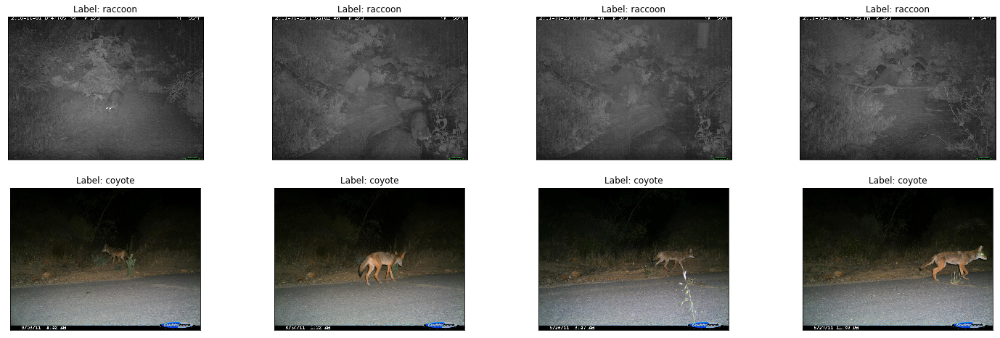

In [12]:
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(train_df.loc[(train_df['classes'] == i) & (train_df['location'].isin([100, 120])), 'file_name'], 4) for i in ['raccoon', 'coyote']]

imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in ['raccoon', 'coyote']]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):

    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../../../data/iWildCam/train/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

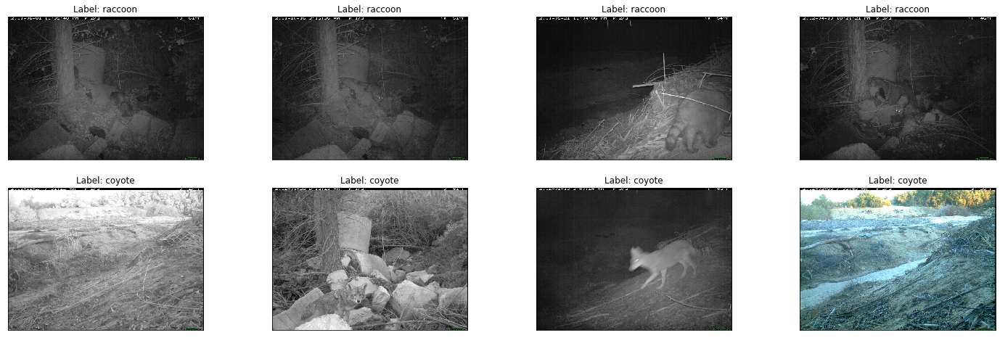

In [13]:
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(train_df.loc[(train_df['classes'] == i) & (train_df['location'].isin([130, 115])), 'file_name'], 4) for i in ['raccoon', 'coyote']]

imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in ['raccoon', 'coyote']]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):

    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../../../data/iWildCam/train/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

In [20]:
len(os.listdir("../../../data/iWildCam/train/"))

196086

In [22]:
train_df['file_name'].tolist()

['5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg',
 '588a679f-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg',
 '5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg',
 '599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg',
 '593d68d7-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59fae563-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58782b45-23d2-11e8-a6a3-ec086b02610b.jpg',
 '5911d8fd-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59292e5e-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58b13139-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59c806c2-23d2-11e8-a6a3-ec086b02610b.jpg',
 '595f7b9c-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58adc33d-23d2-11e8-a6a3-ec086b02610b.jpg',
 '5883e97b-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58d47cf1-23d2-11e8-a6a3-ec086b02610b.jpg',
 '5a096958-23d2-11e8-a6a3-ec086b02610b.jpg',
 '588a66f6-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59adfdd1-23d2-11e8-a6a3-ec086b02610b.jpg',
 '59bac8fe-23d2-11e8-a6a3-ec086b02610b.jpg',
 '597b484b-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58d15f82-23d2-11e8-a6a3-ec086b02610b.jpg',
 '58995a34

In [50]:
train_df.loc[train_df['file_name'] == '585c06ae-23d2-11e8-a6a3-ec086b02610b.jpg']

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height,classes
14834,11,2011-04-30 06:40:19,585c06ae-23d2-11e8-a6a3-ec086b02610b.jpg,1,585c06ae-23d2-11e8-a6a3-ec086b02610b,125,Justin Brown,6f15ab38-5567-11e8-86e8-dca9047ef277,3,1024,747,coyote
14835,11,2011-04-30 06:40:19,585c06ae-23d2-11e8-a6a3-ec086b02610b.jpg,1,585c06ae-23d2-11e8-a6a3-ec086b02610b,125,Justin Brown,6f15ab38-5567-11e8-86e8-dca9047ef277,3,1024,747,coyote
14836,8,2011-04-30 06:40:19,585c06ae-23d2-11e8-a6a3-ec086b02610b.jpg,1,585c06ae-23d2-11e8-a6a3-ec086b02610b,125,Justin Brown,6f15ab38-5567-11e8-86e8-dca9047ef277,3,1024,747,rabbit
14837,8,2011-04-30 06:40:19,585c06ae-23d2-11e8-a6a3-ec086b02610b.jpg,1,585c06ae-23d2-11e8-a6a3-ec086b02610b,125,Justin Brown,6f15ab38-5567-11e8-86e8-dca9047ef277,3,1024,747,rabbit


In [19]:
train_df['classes']

0         opossum
1         opossum
2           empty
3           empty
4           empty
           ...   
196294      empty
196295      empty
196296     rodent
196297      empty
196298      empty
Name: classes, Length: 196299, dtype: object

In [14]:
import torch
a = torch.Tensor([1, 2, 3, 4, 5])
a.shape[0]

5

In [15]:
a

tensor([1., 2., 3., 4., 5.])

In [16]:
a.resize_((a.shape[0], 1))

tensor([[1.],
        [2.],
        [3.],
        [4.],
        [5.]])

In [17]:
a

tensor([[1.],
        [2.],
        [3.],
        [4.],
        [5.]])

In [18]:
a.shape

torch.Size([5, 1])